# Import libraries

In [1]:
import pandas as pd
from scipy.stats import wilcoxon
import matplotlib.pyplot as plt
from matplotlib import rc
import numpy as np
import utils
import config
import re
import os

In [2]:
# set figure details
rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=True)

# Metadata

In [3]:
metadata = pd.read_csv(os.path.join(config.CLEAN_DIR, "metadata.tsv"), sep="\t", index_col=0)
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,expo_cat1,expo_cat2,calc_age_mo,currentfeed_bf,currentfeed_f,currentfeed_o,Sequencing_Project,Filename,Extraction,depth
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.07,1.0,0.0,magic.0001,Knights_Project_046,magic.0001.S22.001.fa,MagAttract,1544781
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.23,1.0,0.0,magic.0004,Knights_Project_046,magic.0004.S34.001.fa,MagAttract,1167038
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0006,Knights_Project_076_Pool3,magic.0006.S145.001.fa,PowerSoil,1720636
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,0.03,1.0,1.0,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,No antibiotics,Vaginal,24.11,NaN,NaN,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,No antibiotics,Vaginal,24.11,NaN,NaN,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,GBS antibiotics,C-section with labor,24.34,NaN,NaN,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388


In [4]:
genefamilies = pd.read_csv(os.path.join(config.CLEAN_DIR, "humann_genefamilies_clean.tsv"), sep="\t", index_col=0)

gene_richness = (genefamilies > 0).sum(axis=1)
metadata["Gene Richness"] = gene_richness

CAGs = pd.read_csv(os.path.join(config.CLEAN_DIR, "reduced_CAG_profiles_clean.tsv"), sep="\t", index_col=0)
CAG_richness = (CAGs > 0).sum(axis=1)
metadata["CAG Richness"] = CAG_richness

pathways = pd.read_csv(os.path.join(config.CLEAN_DIR, "humann_pathcoverage_clean.tsv"), sep="\t", index_col=0)

pathway_richness = (pathways > 0.75).sum(axis=1)
metadata["Pathway Richness"] = pathway_richness

species = pd.read_csv(os.path.join(config.CLEAN_DIR, "gtdb_species.tsv"), sep="\t", index_col=0)
species_richness = (species > 0.00001).sum(axis=1)
metadata["Species Richness"] = species_richness

metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,currentfeed_f,currentfeed_o,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,0.0,magic.0001,Knights_Project_046,magic.0001.S22.001.fa,MagAttract,1544781,7764,119,37,451
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,0.0,magic.0004,Knights_Project_046,magic.0004.S34.001.fa,MagAttract,1167038,7753,119,28,550
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,1.0,magic.0006,Knights_Project_076_Pool3,magic.0006.S145.001.fa,PowerSoil,1720636,2888,52,19,695
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,1.0,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,8650,146,36,707
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,1.0,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,7908,129,39,391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,NaN,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,3745,119,64,1999
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,NaN,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,1928,73,52,1775
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,NaN,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,4586,112,67,1594


In [5]:
metadata["abx"] = metadata["expo_cat1"]
abxs = metadata["abx"].unique()
display(abxs)
metadata

array(['No antibiotics', 'Other antibiotics', 'GBS antibiotics'],
      dtype=object)

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,currentfeed_o,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,abx
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,magic.0001,Knights_Project_046,magic.0001.S22.001.fa,MagAttract,1544781,7764,119,37,451,No antibiotics
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,magic.0004,Knights_Project_046,magic.0004.S34.001.fa,MagAttract,1167038,7753,119,28,550,No antibiotics
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,magic.0006,Knights_Project_076_Pool3,magic.0006.S145.001.fa,PowerSoil,1720636,2888,52,19,695,No antibiotics
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,magic.0007,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,8650,146,36,707,No antibiotics
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,magic.0008,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,7908,129,39,391,No antibiotics
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,magic.6595,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,3745,119,64,1999,No antibiotics
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,magic.6597,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,1928,73,52,1775,No antibiotics
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,magic.6598,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,4586,112,67,1594,GBS antibiotics


In [6]:
ptr = pd.read_csv(os.path.join(config.CLEAN_DIR, "ptr.csv"), index_col=0)
ptr

,magic.0001,magic.0004,magic.0006,magic.0007,magic.0008,magic.0010,magic.0011,magic.0012,magic.0013,magic.0014,...,magic.6590,magic.6591,magic.6592,magic.6593,magic.6594,magic.6595,magic.6597,magic.6598,magic.6599,magic.6600
gtdb_taxonomy,,,,,,,,,,,,,,,,,,,,,
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus thermophilus,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.890374,0.000000,0.000000,0.000000,0.000000,0.000000,0.398078,0.000000,0.443034
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Oscillospiraceae;g__Intestinimonas;s__Intestinimonas butyriciproducens,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.181598,0.000000,0.000000,0.000000,0.153008,0.164560,0.000000,0.181179,0.000000,0.364100
d__Bacteria;p__Verrucomicrobia;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia;s__Akkermansia muciniphila,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.531152,0.000000,0.000000,0.000000,0.000000,0.385291,0.339425
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Ruminococcaceae;g__Ruminiclostridium_E;s__Ruminiclostridium_E siraeum,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.366896,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum,0.0,0.0,0.0,0.0,0,0.0,0.439616,0.0,0.0,0.0,...,0.000000,0.648231,0.639207,0.000000,0.279416,0.547436,0.706284,0.624992,0.793504,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d__Bacteria;p__Firmicutes;c__Clostridia;o__Lachnospirales;f__Lachnospiraceae;g__Blautia;s__,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Actinomycetaceae;g__Actinomyces_B;s__,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Betaproteobacteriales;f__Burkholderiaceae;g__Diaphorobacter;s__Diaphorobacter ebreus,0.0,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [7]:
(ptr > 0).mean(axis=1).sort_values()[-10:]

gtdb_taxonomy
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__Oscillospiraceae;g__Intestinimonas;s__Intestinimonas butyriciproducens      0.071761
d__Bacteria;p__Verrucomicrobia;c__Verrucomicrobiae;o__Verrucomicrobiales;f__Akkermansiaceae;g__Akkermansia;s__Akkermansia muciniphila     0.079314
d__Bacteria;p__Bacteroidetes;c__Bacteroidia;o__Bacteroidales;f__Bacteroidaceae;g__Bacteroides;s__Bacteroides xylanisolvens                0.087159
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus thermophilus                0.088902
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Enterobacterales;f__Enterobacteriaceae;g__Klebsiella_A;s__Klebsiella_A oxytoca    0.106915
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Streptococcaceae;g__Streptococcus;s__Streptococcus salivarius                  0.144102
d__Bacteria;p__Firmicutes;c__Bacilli;o__Lactobacillales;f__Enterococcaceae;g__Enterococcus;s__Enterococc

In [8]:
longum = ptr.loc["d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum"]
longum

magic.0001    0.000000
magic.0004    0.000000
magic.0006    0.000000
magic.0007    0.000000
magic.0008    0.000000
                ...   
magic.6595    0.547436
magic.6597    0.706284
magic.6598    0.624992
magic.6599    0.793504
magic.6600    0.000000
Name: d__Bacteria;p__Actinobacteria;c__Actinobacteria;o__Actinomycetales;f__Bifidobacteriaceae;g__Bifidobacterium;s__Bifidobacterium longum, Length: 3442, dtype: float64

In [10]:
assert(all(metadata.index == longum.index))
metadata["longum"] = longum
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Sequencing_Project,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,abx,longum
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_046,magic.0001.S22.001.fa,MagAttract,1544781,7764,119,37,451,No antibiotics,0.000000
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,Knights_Project_046,magic.0004.S34.001.fa,MagAttract,1167038,7753,119,28,550,No antibiotics,0.000000
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_076_Pool3,magic.0006.S145.001.fa,PowerSoil,1720636,2888,52,19,695,No antibiotics,0.000000
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_076_Pool3,magic.0007.S155.001.fa,PowerSoil,6825017,8650,146,36,707,No antibiotics,0.000000
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,Knights_Project_055,X8.S125.001.fa,PowerSoil,2928044,7908,129,39,391,No antibiotics,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,Knights_Project_077_Pool3,magic.6595.S253.001.fa,PowerSoilPro,1562968,3745,119,64,1999,No antibiotics,0.547436
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,Knights_Project_077_Pool3,magic.6597.S265.001.fa,PowerSoilPro,2113880,1928,73,52,1775,No antibiotics,0.706284
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,Knights_Project_077_Pool3,magic.6598.S277.001.fa,PowerSoilPro,1650388,4586,112,67,1594,GBS antibiotics,0.624992


In [11]:
metadata["timepoint"] = metadata["Timeline_Weeks"]

has_time_info = ~metadata["Timeline_Weeks"].isna() & (metadata["Timeline_Weeks"] != "na")
metadata = metadata.loc[has_time_info]
metadata

,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Filename,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,abx,longum,timepoint
Sample_ID,,,,,,,,,,,,,,,,,,,,,
magic.0001,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,magic.0001.S22.001.fa,MagAttract,1544781,7764,119,37,451,No antibiotics,0.000000,0
magic.0004,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,magic.0004.S34.001.fa,MagAttract,1167038,7753,119,28,550,No antibiotics,0.000000,1
magic.0006,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,magic.0006.S145.001.fa,PowerSoil,1720636,2888,52,19,695,No antibiotics,0.000000,0
magic.0007,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,magic.0007.S155.001.fa,PowerSoil,6825017,8650,146,36,707,No antibiotics,0.000000,0
magic.0008,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,X8.S125.001.fa,PowerSoil,2928044,7908,129,39,391,No antibiotics,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
magic.6595,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,magic.6595.S253.001.fa,PowerSoilPro,1562968,3745,119,64,1999,No antibiotics,0.547436,96
magic.6597,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,magic.6597.S265.001.fa,PowerSoilPro,2113880,1928,73,52,1775,No antibiotics,0.706284,96
magic.6598,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,magic.6598.S277.001.fa,PowerSoilPro,1650388,4586,112,67,1594,GBS antibiotics,0.624992,96


In [12]:
metadata.index = metadata["Patient_No"]
metadata["timepoint_plot"] = [int(time) for time in metadata["timepoint"]]
# metadata["timepoint_plot"] = metadata["timepoint_plot"].apply(lambda x : {0 : 0, 1 : 1, 2 : 2, 3 : 3, 4 : 4, 
#     12: 5, 24 : 6, 36 : 7, 48 : 8, 60 : 9, 72 : 10, 84 : 11, 96 : 12}[x])
metadata

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_26044/1879103518.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["timepoint_plot"] = [int(time) for time in metadata["timepoint"]]


,Patient_No,Hospital,Date_Collected,Time_Collected,Timeline_Weeks,Abx_regular,Abx_anomoly,Abx_timeline.prior..during..after.,abx_day,Consistency,...,Extraction,depth,Gene Richness,CAG Richness,Pathway Richness,Species Richness,abx,longum,timepoint,timepoint_plot
Patient_No,,,,,,,,,,,,,,,,,,,,,
101,101,no,12/10/16,1430,0,regular,NaN,NaN,NaN,NaN,...,MagAttract,1544781,7764,119,37,451,No antibiotics,0.000000,0,0
101,101,no,12/15/16,NaN,1,regular,NaN,NaN,NaN,NaN,...,MagAttract,1167038,7753,119,28,550,No antibiotics,0.000000,1,1
104,104,yes,12/15/16,2335,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,1720636,2888,52,19,695,No antibiotics,0.000000,0,0
105,105,yes,12/15/16,2115,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,6825017,8650,146,36,707,No antibiotics,0.000000,0,0
105,105,yes,12/15/16,1525,0,regular,NaN,NaN,NaN,NaN,...,PowerSoil,2928044,7908,129,39,391,No antibiotics,0.000000,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
588,588,NaN,8/22/21,1702,96,regular,NaN,NaN,NaN,NaN,...,PowerSoilPro,1562968,3745,119,64,1999,No antibiotics,0.547436,96,96
595,595,NaN,9/6/21,NaN,96,regular,NaN,NaN,NaN,formed,...,PowerSoilPro,2113880,1928,73,52,1775,No antibiotics,0.706284,96,96
585,585,NaN,8/23/21,725,96,regular,NaN,NaN,NaN,formed,...,PowerSoilPro,1650388,4586,112,67,1594,GBS antibiotics,0.624992,96,96


In [13]:
timepoints_sorted = np.unique(metadata["Timeline_Weeks"])
timepoints_sorted = sorted(timepoints_sorted, key=lambda x : int(x))

No antibiotics       177
Other antibiotics    143
GBS antibiotics       73
Name: abx, dtype: int64


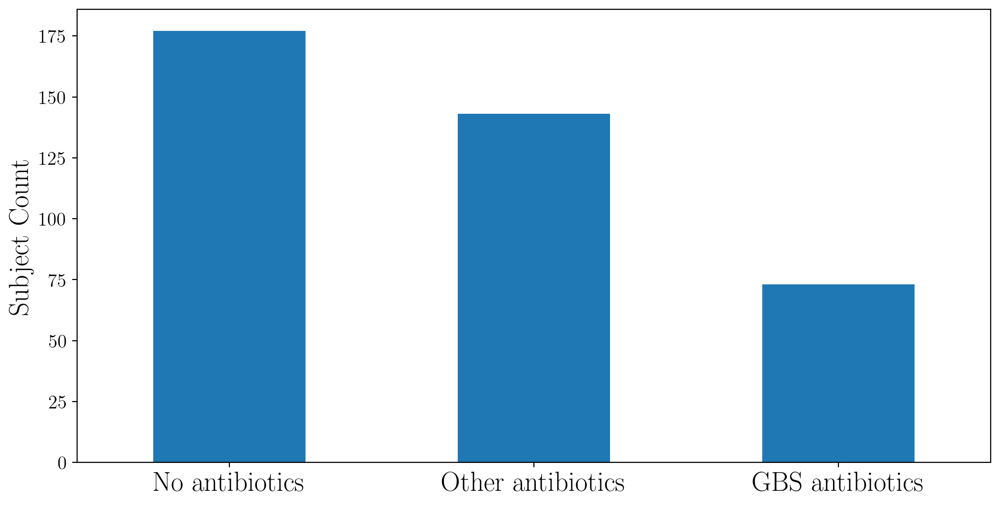

In [14]:
plt.figure(figsize=(12, 6), dpi=200)
abx_counts = metadata.drop_duplicates("Patient_No")["abx"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [15]:
def plot_index(index):
    for abx in abxs:
        print(abx)
        fig = plt.figure(figsize=(16, 4), dpi=200)
        ax = plt.gca()
        
        plotted_longitudinal = []

        subjects = np.unique(metadata.index)
        for subject in subjects:
            df = metadata.loc[[subject]].copy()
            df = df[df["abx"] == abx]
            df = df.sort_values("timepoint_plot")
            df = df.drop_duplicates("Timeline_Weeks")
            plotted_longitudinal.append(df)
            ax.plot(df["timepoint_plot"], df[index], c="gray", zorder=0, alpha=0.2)
        ax.set_xticks([int(t) for t in timepoints_sorted])
        ax.set_xticklabels(timepoints_sorted)
        ax.set_ylabel(index, fontsize=18)
        ax.set_xlabel("Time point (weeks)", fontsize=18)
        
        plotted_df = pd.concat(plotted_longitudinal)

        for i, time in enumerate(timepoints_sorted):
            data = plotted_df[plotted_df["timepoint"] == time][index]
            sc = ax.scatter(np.ones(data.shape[0]) * int(time), data, s=2 if i < 5 else 10)
            c = sc.get_facecolors()[0].tolist()
            width = 2.0 if i < 5 else 2
            widths = 0.75 if i < 5 else 3
            bp = ax.boxplot(data, positions=[int(time)], patch_artist=True, widths=[widths],
                boxprops=dict(facecolor=[0, 0, 0, 0], color=c, linewidth=width),
                capprops=dict(color=c, linewidth=0),
                whiskerprops=dict(color=c, linewidth=width),
                flierprops=dict(color=c, markeredgecolor=c, linewidth=width),
                medianprops=dict(color=c, linewidth=width))

No antibiotics
Other antibiotics
GBS antibiotics


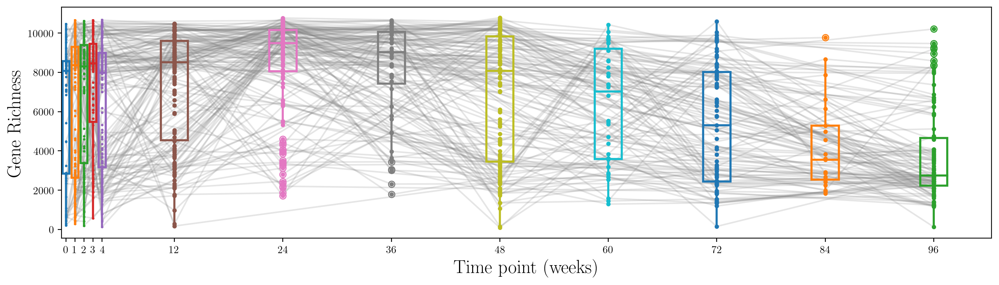

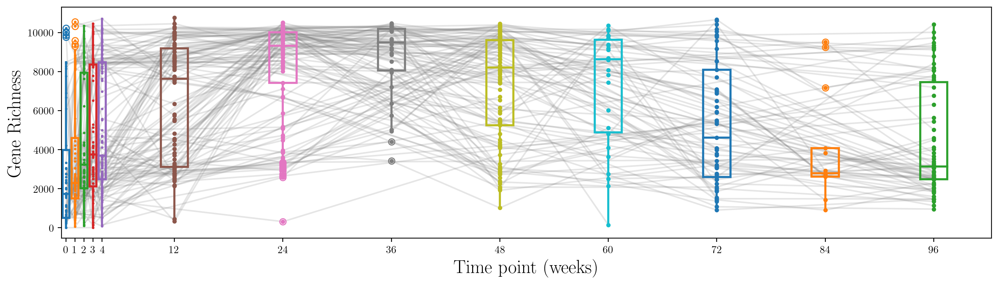

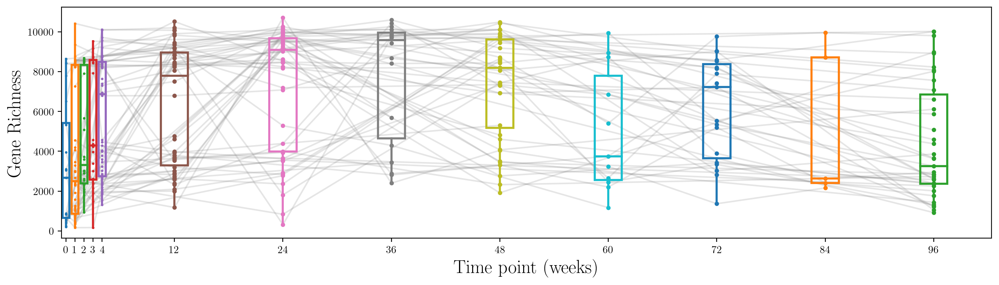

In [17]:
plot_index("Gene Richness")

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_26044/2440689067.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["Gene Richness (Full)"] = metadata["Gene Richness"]


No antibiotics
Other antibiotics
GBS antibiotics


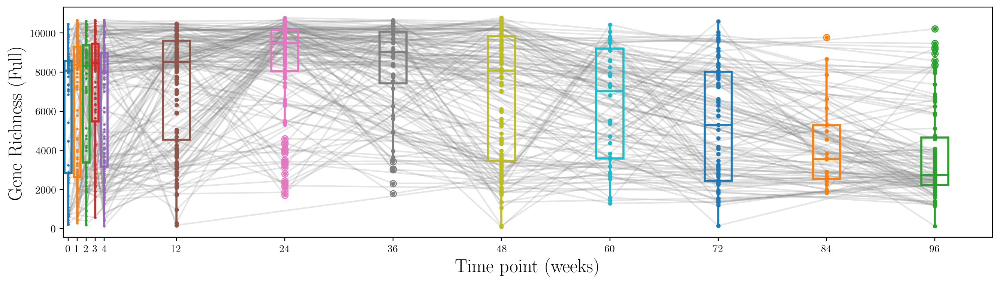

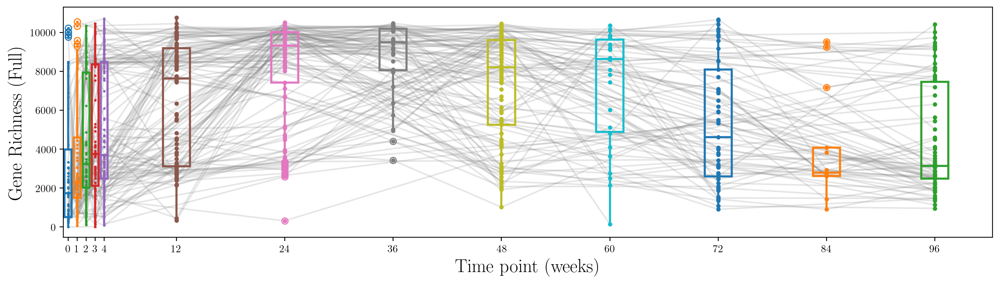

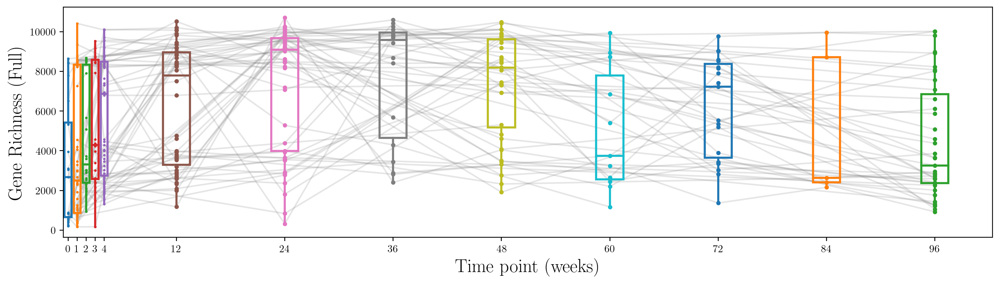

In [21]:
metadata["Gene Richness (Full)"] = metadata["Gene Richness"]

plot_index("Gene Richness (Full)")

No antibiotics
Other antibiotics
GBS antibiotics


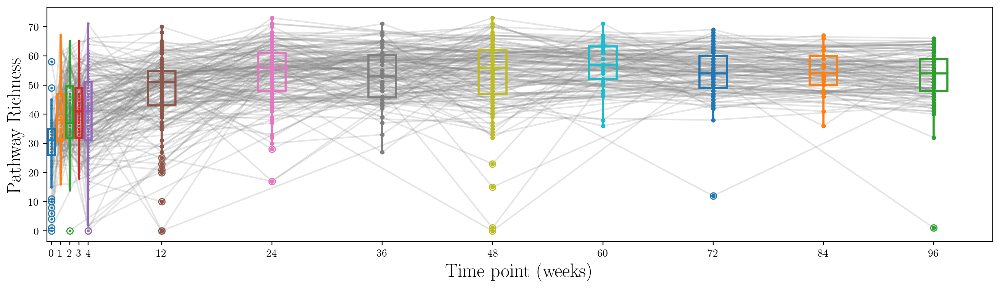

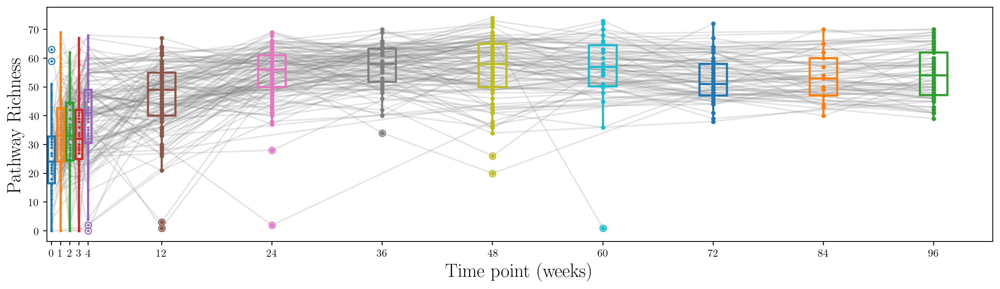

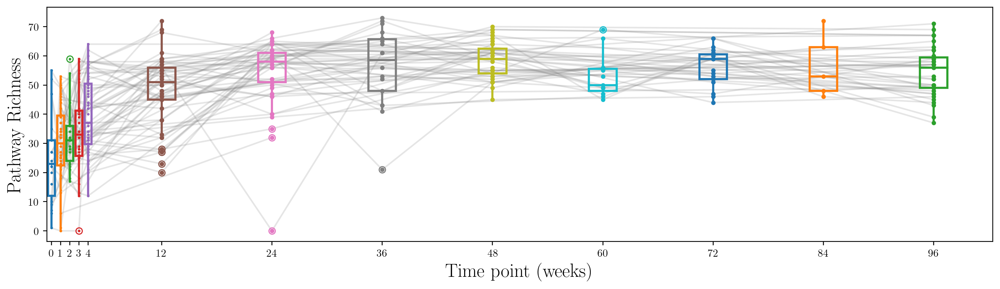

In [22]:
plot_index("Pathway Richness")

No antibiotics
Other antibiotics
GBS antibiotics


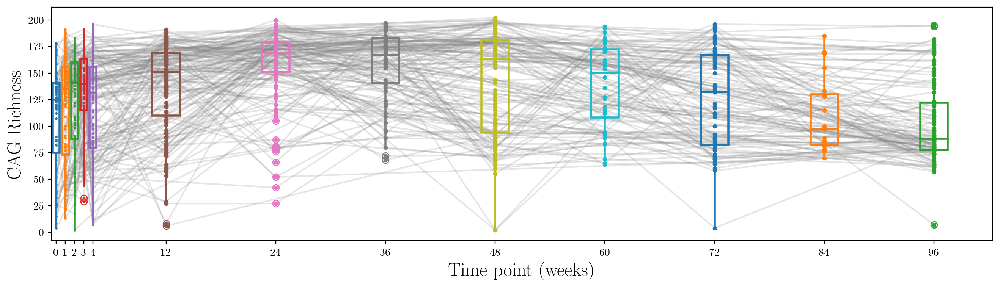

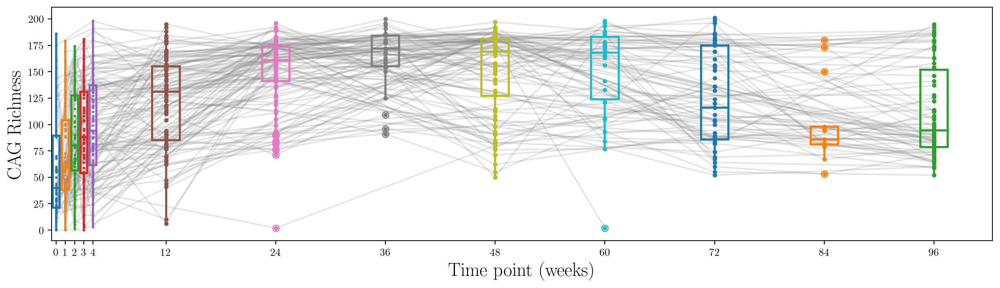

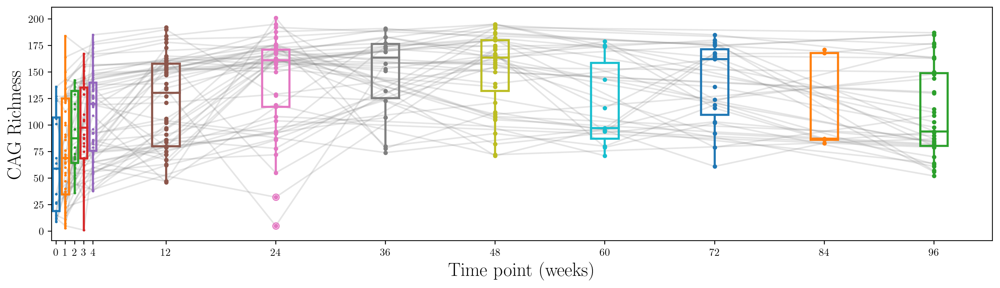

In [23]:
plot_index("CAG Richness")

No antibiotics
Other antibiotics
GBS antibiotics


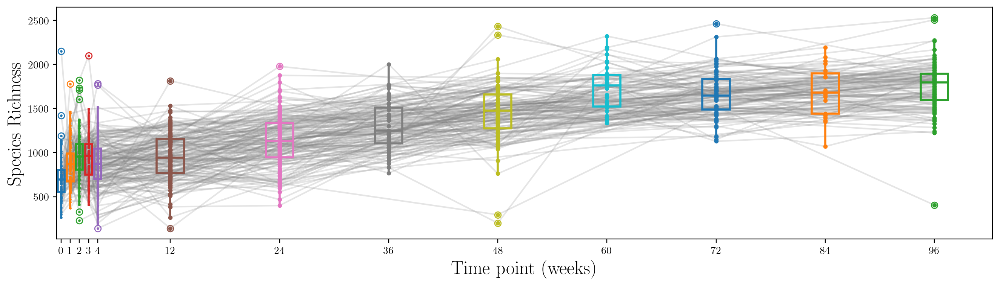

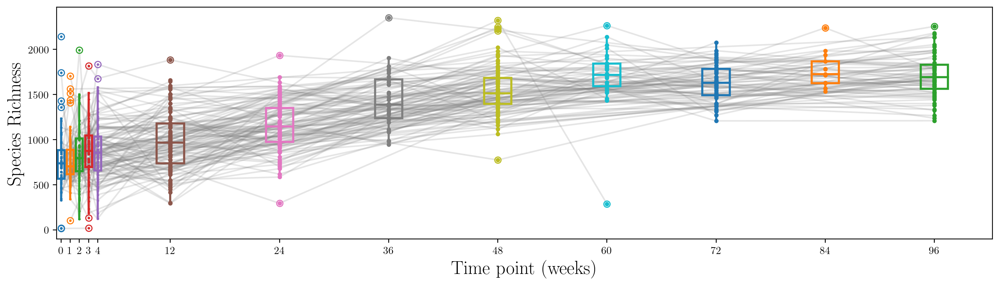

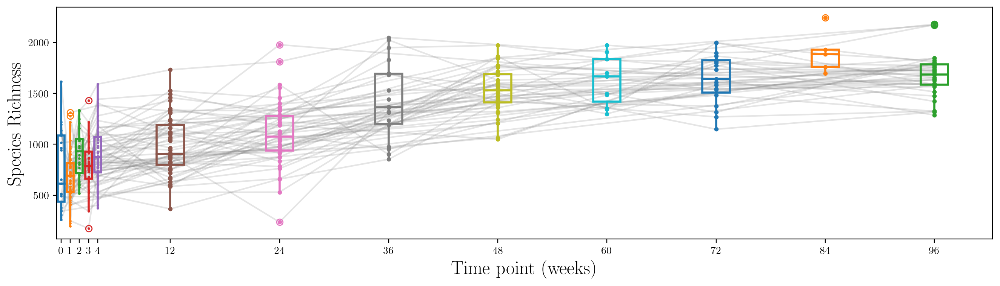

In [24]:
plot_index("Species Richness")

/var/folders/w8/85y9rkfs49x53d7kk_ql70bc0000gn/T/ipykernel_26044/2948967023.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metadata["Bifidobacterium longum log2(PTR)"] = metadata["longum"]


No antibiotics
Other antibiotics
GBS antibiotics


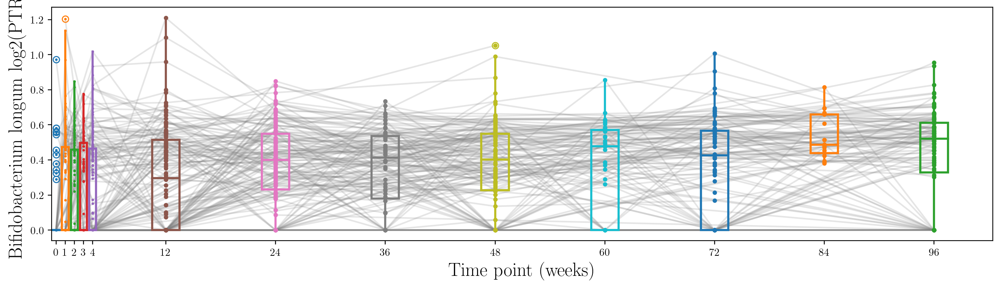

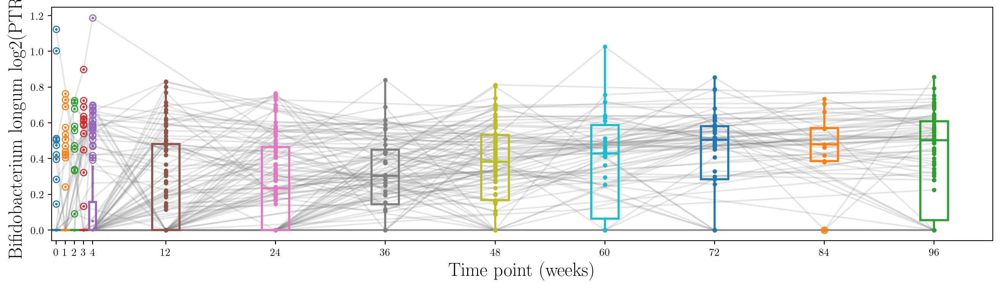

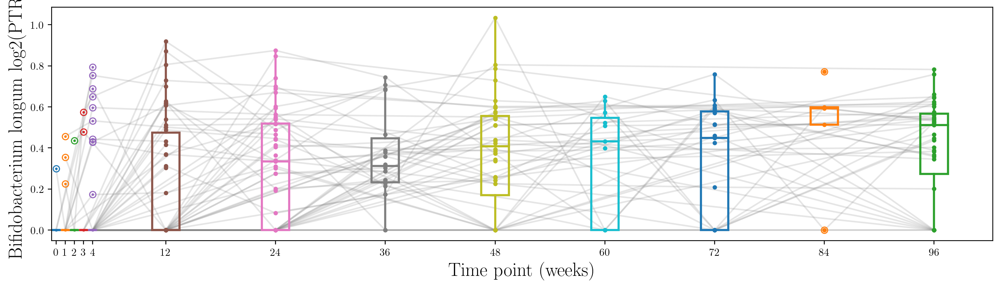

In [28]:

metadata["Bifidobacterium longum log2(PTR)"] = metadata["longum"]

plot_index("Bifidobacterium longum log2(PTR)")

In [ ]:
test = metadata.drop_duplicates("Patient_No")
plt.figure(figsize=(8, 6), dpi=200)
abx_counts = test[test["abx"] == "No antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [ ]:
plt.figure(figsize=(12, 6), dpi=200)
abx_counts = test[test["abx"] == "Other antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)

In [ ]:
plt.figure(figsize=(8, 6), dpi=200)
abx_counts = test[test["abx"] == "GBS antibiotics"]["expo_cat2"].value_counts()
print(abx_counts)
abx_counts.plot.bar()
plt.ylabel("Subject Count", fontsize=20)
ax = plt.gca()
ax.tick_params(axis='x', which='major', labelsize=20, rotation=0)
ax.tick_params(axis='y', which='major', labelsize=14)